## Advanced Lane Finding Project
The goals / steps of this project are the following:
- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply a distortion correction to raw images.
- Use color transforms, gradients, etc., to create a thresholded binary image.
- Apply a perspective transform to rectify binary image ("birds-eye view").
- Detect lane pixels and fit to find the lane boundary.
- Determine the curvature of the lane and vehicle position with respect to center.
- Warp the detected lane boundaries back onto the original image.
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Compute Camera Calibration using Chessboard Images

Images ['camera_cal/calibration5.jpg', 'camera_cal/calibration4.jpg', 'camera_cal/calibration15.jpg', 'camera_cal/calibration7.jpg', 'camera_cal/calibration3.jpg', 'camera_cal/calibration17.jpg', 'camera_cal/calibration8.jpg', 'camera_cal/calibration6.jpg', 'camera_cal/calibration20.jpg', 'camera_cal/calibration14.jpg', 'camera_cal/calibration9.jpg', 'camera_cal/calibration2.jpg', 'camera_cal/calibration19.jpg', 'camera_cal/calibration12.jpg', 'camera_cal/calibration11.jpg', 'camera_cal/calibration13.jpg', 'camera_cal/calibration1.jpg', 'camera_cal/calibration10.jpg', 'camera_cal/calibration16.jpg', 'camera_cal/calibration18.jpg']


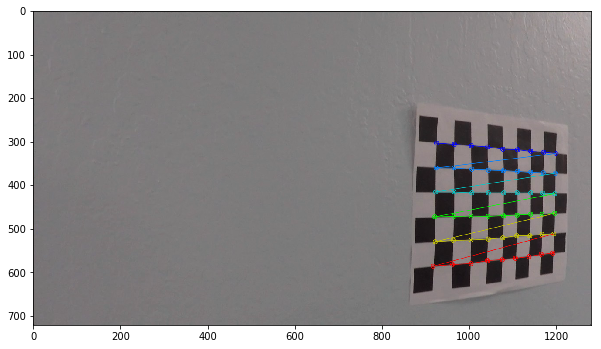

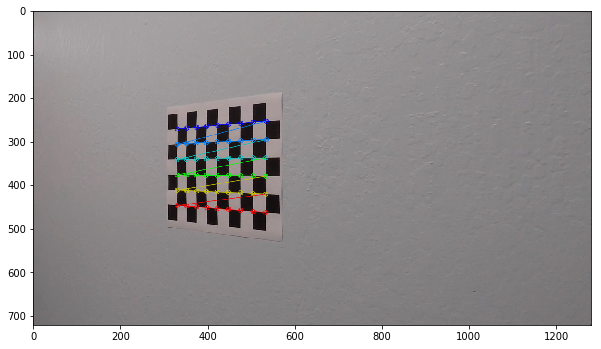

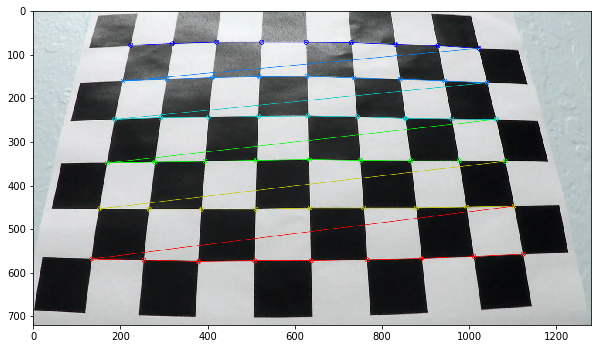

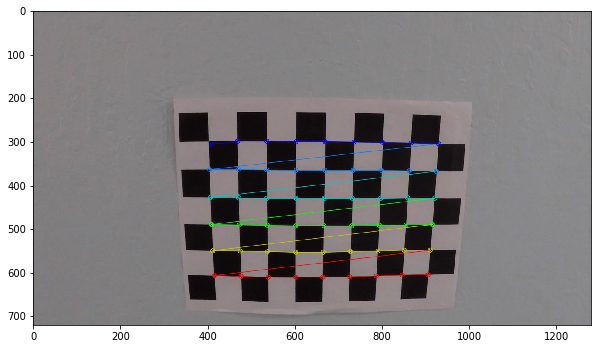

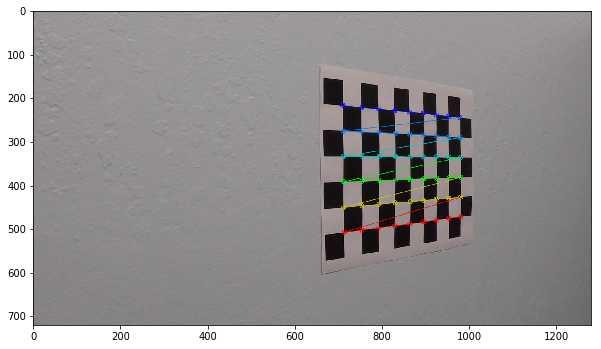

...

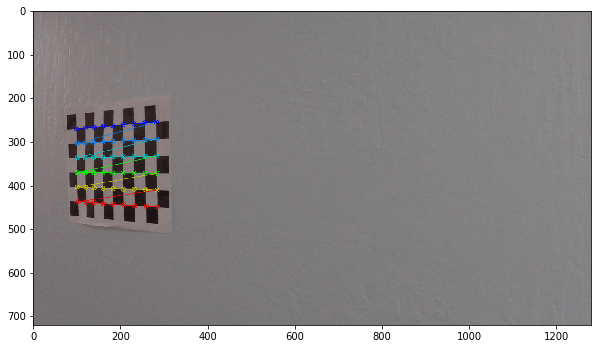

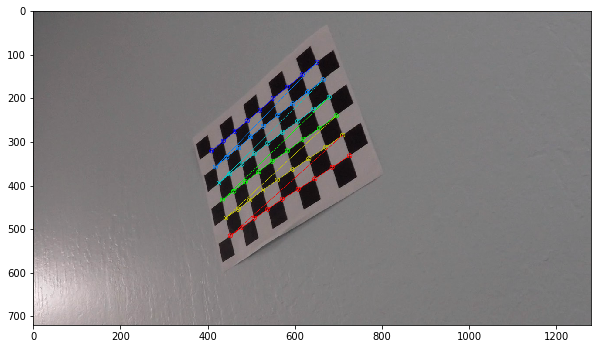

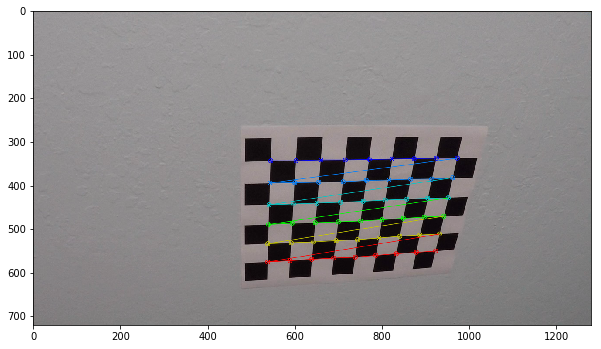

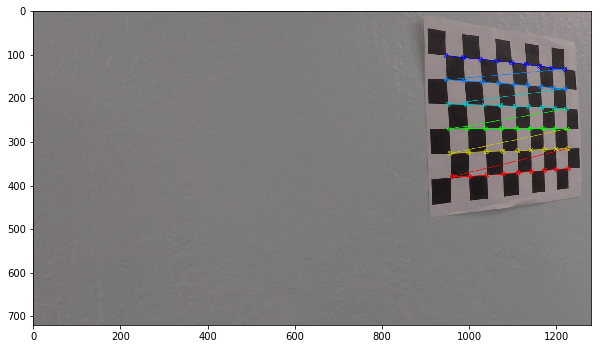

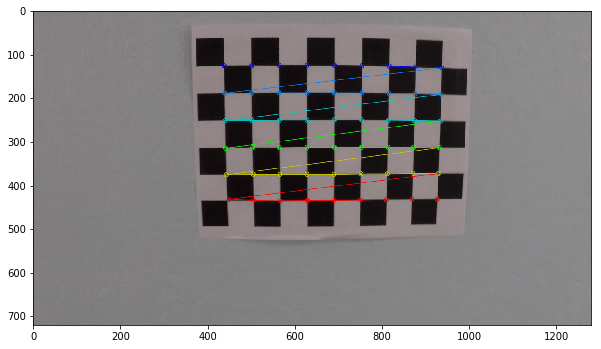

In [11]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10,10)


CAMERA_CALIB_FILE = 'camera_calibration.p'

#%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
# grid represenatation
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

print ("Images", images)

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)
        plt.show()
    
        


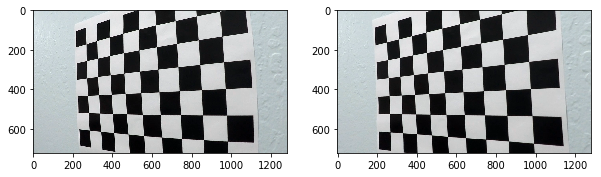

In [2]:
import pickle

# grab an image for testing
orig = cv2.imread(images[2])
img = test_img = cv2.imread(images[1])
img_size = (img.shape[1], img.shape[0])

# camera calibration with object points and image points extracted in previous cell
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

undist_image = cv2.undistort(img, mtx, dist, None, mtx)

plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(undist_image)
plt.show()

# save pickled dictionary with camera calibration information

camera_calibration_data = {"matrix" : mtx,
                           "distortion" : dist,
                           "rotation" : rvecs,     # not used in project
                           "translation" : tvecs}  # not used in project
# save to file for later reuse
with open(CAMERA_CALIB_FILE, 'wb') as f:
    pickle.dump(camera_calibration_data, f)



## Load in test images and develop pipleline


 ## Thresholding Helper Functions 

In [13]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def abs_sobel_threshold(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Take the derivative in x or y given orient = 'x' or 'y'
    # 2) Take the absolute value of the derivative or gradient
    # 3) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 4) Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    # 5) Return this mask as your binary_output image
    
    if orient == 'x':
        sobel = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel,  )
    else:
        sobel = cv2.Sobel(image, cv2.CV_65F, 0, 1, ksize = sobel_kernel, )
    
    # cleanup derivative for display
    sobel = abs(sobel)
    sobel = np.uint8(255*sobel / np.max(sobel))
    binary_output = np.zeros_like(sobel)
    binary_output[(sobel >= thresh[0]) & (sobel <= thresh[1])] = 1
    
    return binary_output

def mag_threshold(image, sobel_kernel=3, thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Take the gradient in x and y separately
    # 2) Calculate the magnitude 
    # 3) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 4) Create a binary mask where mag thresholds are met
    # 5) Return this mask as your binary_output image
    
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = sobel_kernel)

    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # 1) Take the gradient in x and y separately
    # 2) Take the absolute value of the x and y gradients
    # 3) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 4) Create a binary mask where direction thresholds are met
    # 5) Return this mask as your binary_output image
    
    sobelx = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel)) 
    sobely = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    gradient_dir = np.arctan2(sobely, sobelx)
    
    binary_output = np.zeros_like(gradient_dir)
    binary_output[(gradient_dir >= thresh[0]) & (gradient_dir <= thresh[1])] = 1

    return binary_output

def color_threshold(image, thresh = (0, 255)):
    # applies a simple color (value) thresholding to the image
    binary_output = np.zeros_like(image)
    binary_output[(image >= thresh[0]) & (image <= thresh[1])] = 1
    return binary_output

def combine_binary_and(img_a, img_b):
    # combine (AND) two binary images and output results
    binary_output_combined = np.zeros_like(img_a)
    
    binary_output_combined[(img_a == 1) & (img_b == 1)] = 1
    
    return binary_output_combined

def combine_binary_or(img_a, img_b):
    # combine (AND) two binary images and output results
    binary_output_combined = np.zeros_like(img_a)
    
    binary_output_combined[(img_a == 1) | (img_b == 1)] = 1
    
    return binary_output_combined

    

## Sliding Window Search Algorithm

Inspired by slide 34 in the Advanced Lane Finding Project Page.

In [14]:
def window_mask(width, height, img_ref, center,level):
    '''masking function --> draws window areas'''
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),
           max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def window_filter(img_ref, mask, width, height, center, level):
    '''selects pixels from mask'''
    
    y_start = int(img_ref.shape[0]-(level+1)*height)
    y_end = int(img_ref.shape[0]-level*height)
    
    x_start = max(0,int(center-width/2))
    x_end =  min(int(center+width/2),img_ref.shape[1])
    
    mask_roi = mask[y_start: y_end, x_start : x_end]
        
    white_pixels = img_ref[y_start: y_end, 
                   x_start : x_end] == 1 
    
    mask_roi[white_pixels] = 1 
    
    
    return mask
    

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        
        #print (level, conv_signal[int(r_center)], conv_signal[int(l_center)])
        
        ## if there is no signal, keep the previous centriod, to avoid centroids drifting to the side
        
        previous_centroid = window_centroids[-1]
        
        if conv_signal[int(r_center)] == 0:
            r_center = previous_centroid[1]
        
        if conv_signal[int(l_center)] == 0:
            l_center = previous_centroid[0]
        
        window_centroids.append((l_center,r_center))

    return window_centroids

def sliding_window_search(warped, window_width = 50, window_height = 80, margin = 100):
    
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)
    
    # holds filter pixels using centroid mask
    filtered_pixels_l = np.zeros_like(warped)
    filtered_pixels_r = np.zeros_like(warped)
    
    
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)
        
        l_filter_points = np.zeros_like(warped)
        r_filter_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
            
            ####### filter out image pixels in the windows on left and on right 
            
            filtered_pixels_r = window_filter(warped,
                                            filtered_pixels_r,
                                            window_width, 
                                            window_height, 
                                            window_centroids[level][1], 
                                            level)
            
            filtered_pixels_l = window_filter(warped,
                                            filtered_pixels_l,
                                            window_width, 
                                            window_height, 
                                            window_centroids[level][0], 
                                            level)
            
            #plt.imshow(filtered_pixels)
            #plt.show()
            
            
            
            #######

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    #print (window_centroids)
    
    return output, filtered_pixels_l, filtered_pixels_r, window_centroids
    
    
    

### Polynomial Fitting and Visualization

Functions for fitting polynomial to image pixels, visualization and calculating real-world curvature.

In [121]:
def fit_poly(image):
    '''fit polynomial to pixels in image and determine curvature radius'''
    
 
    
    ## find indices of nonzero pixels
    y,x = np.where(image > 0)
    
    ploty = np.linspace(0, 719, num=720)

    
    if len(y) == 0:
        return (ploty, np.zeros(720)), 0
    
    # fit 2nd order poly
    p_fit_y = np.polyfit(y,x, 2)
    
    #### provide a plot output
    ## y pixels to plot
    ploty = np.linspace(0, 719, num=720)
    y_eval = np.max(ploty)
    
    ## get x coordinates by mapping polynomial p_fit_y
    fit_x = p_fit_y[0] * ploty**2 + p_fit_y[1] * ploty + p_fit_y[2]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    p_fit_y_cr = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
    curve_rad = ((1 + (2*p_fit_y_cr[0]*y_eval*ym_per_pix + p_fit_y_cr[1])**2)**1.5) / np.absolute(2*p_fit_y_cr[0])
    
    
    return (ploty, fit_x), curve_rad

def draw_poly(image, coords):
    '''coords = y, x with y and x a list of indices for y resp. x coordinates'''
    h,w,_ = image.shape
    
    y,x = coords
    
    #print (y.shape, x.shape)
    
    
    

    #print (" ==== COORDS ==== ")
    #for c in coords:
    #    print (c)

    y = np.int32(y)
    x = np.int32(x)

    # normalize coordinates that can't be drawn
    x = np.minimum(x, w-1)
    x = np.maximum(0,x)
    
    coords = np.int32([i for i in zip(x,y)])
    image = cv2.polylines(image, [coords], 0, (255,255,0), thickness=4)

 
    return image

def draw_poly_filled(image, coords_l, coords_r, cut=40):
    ''' draws filled polygon from left / right lane line fits'''
    y_l,x_l = coords_l
    
    y_r,x_r = coords_r
    
    y_l= y_l[cut:]
    x_l= x_l[cut:]
    
    y_r = y_r[cut:]
    x_r = x_r[cut:]
    
    ### reverse right poly fit so that we get a closed polygon for drawing
    y_r = y_r[::-1]
    x_r = x_r[::-1]
    
    
    
    y = np.hstack((y_l, y_r ))
    x = np.hstack((x_l , x_r ))
    
    #print(y_r.shape, y.shape)
    
    coords = np.int32([i for i in zip(x,y)])
    
    image = cv2.fillPoly(image, [coords], (0,255,0))

    return image
    



        
    
    
    
    

## Static/Development Processing Pipeline Script

Masked Image and perspective transform (rectification)
Sliding window search results
Final Result
Image Undistortion


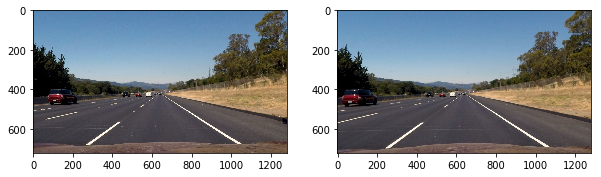

HLS Separation


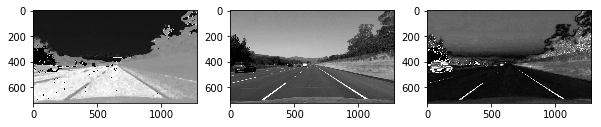

Sobel, Gradient Magn and Gradient Dir and combined 1


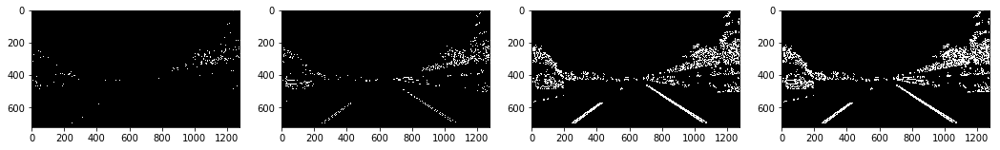

/home/sven/.local/lib/python3.6/site-packages/ipykernel_launcher.py:105: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


Masked Image and perspective transform (rectification)


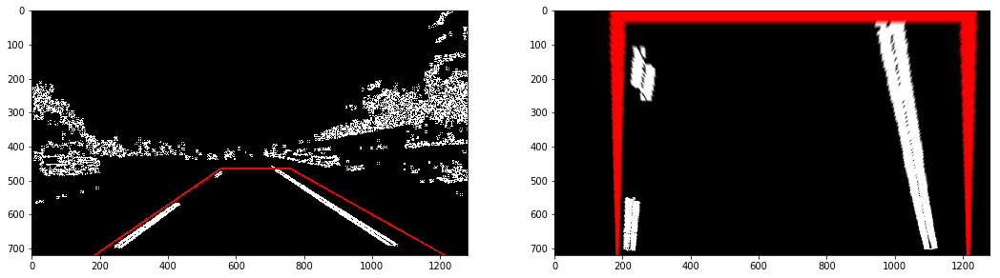

Sliding window search results


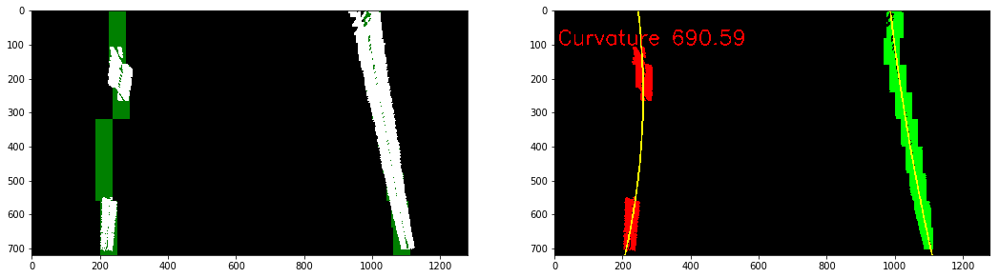

Final Result


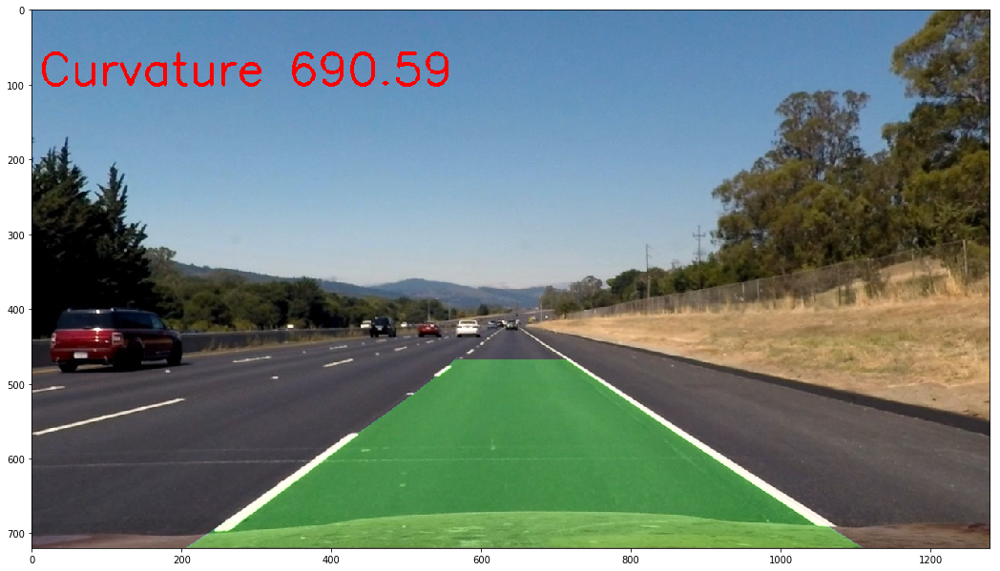

Image Undistortion


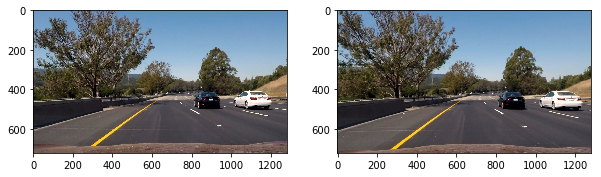

HLS Separation


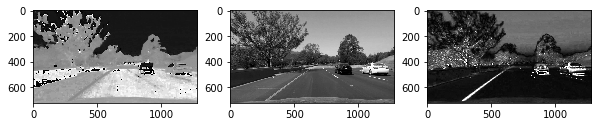

Sobel, Gradient Magn and Gradient Dir and combined 2


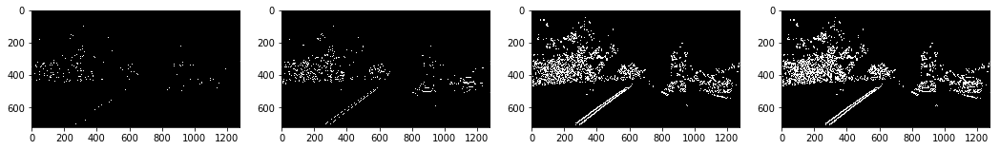

Masked Image and perspective transform (rectification)


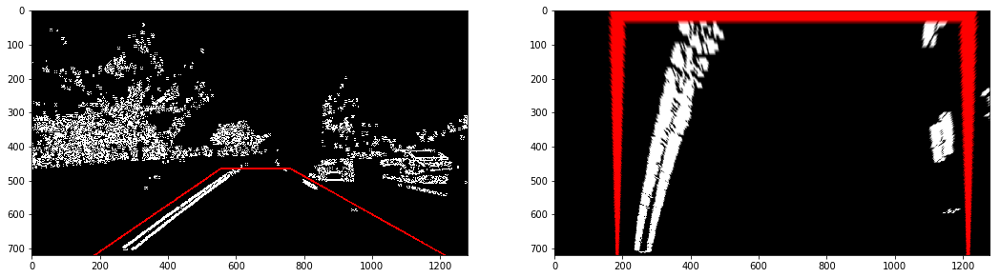

Sliding window search results


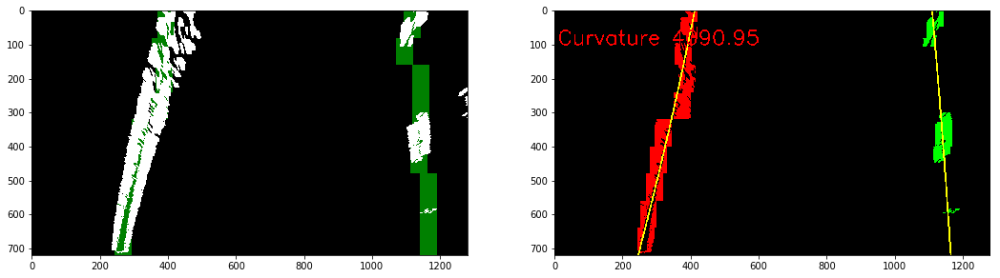

Final Result


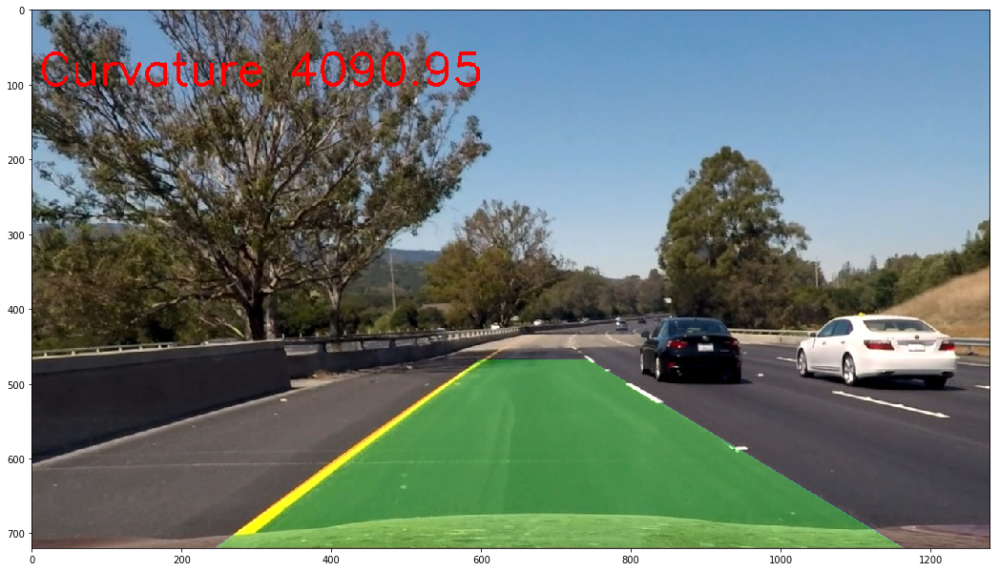

Image Undistortion


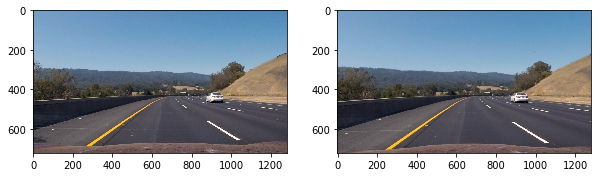

HLS Separation


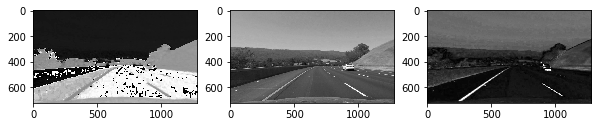

Sobel, Gradient Magn and Gradient Dir and combined 3


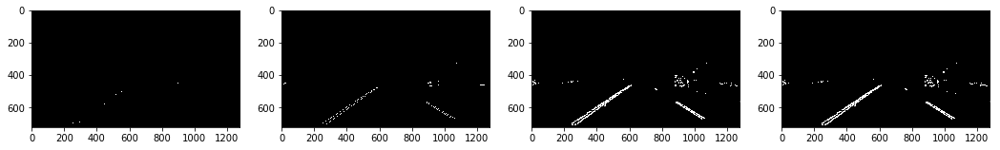

Masked Image and perspective transform (rectification)


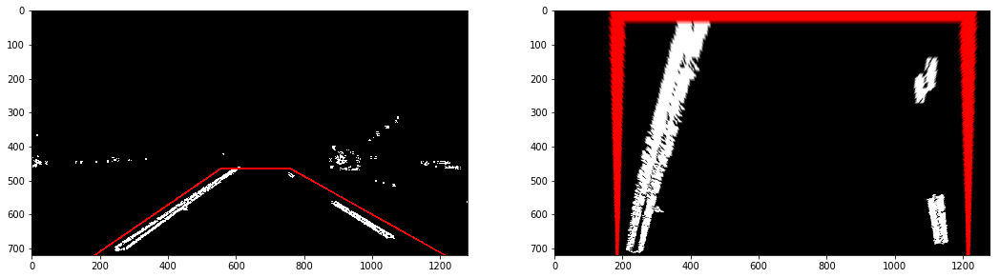

Sliding window search results


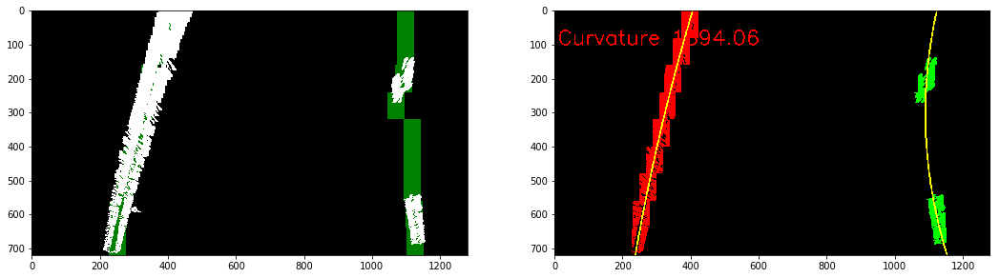

Final Result


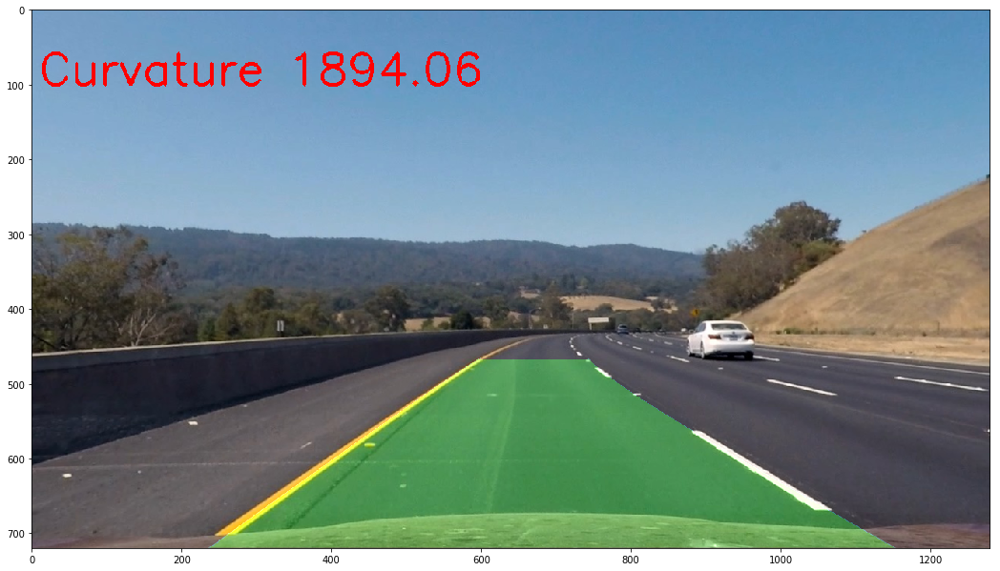

Image Undistortion


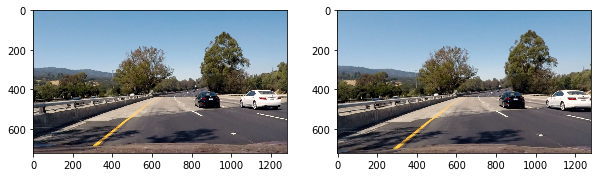

HLS Separation


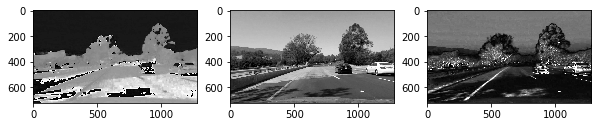

Sobel, Gradient Magn and Gradient Dir and combined 4


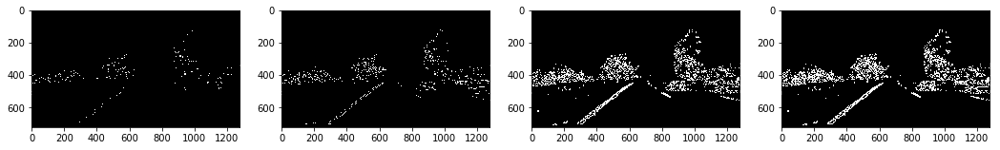

Masked Image and perspective transform (rectification)


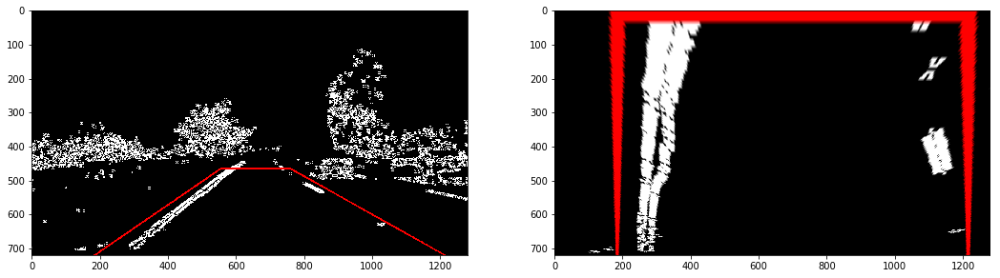

Sliding window search results


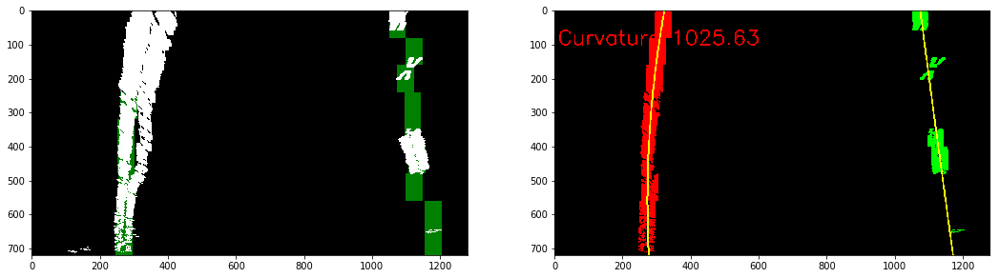

Final Result


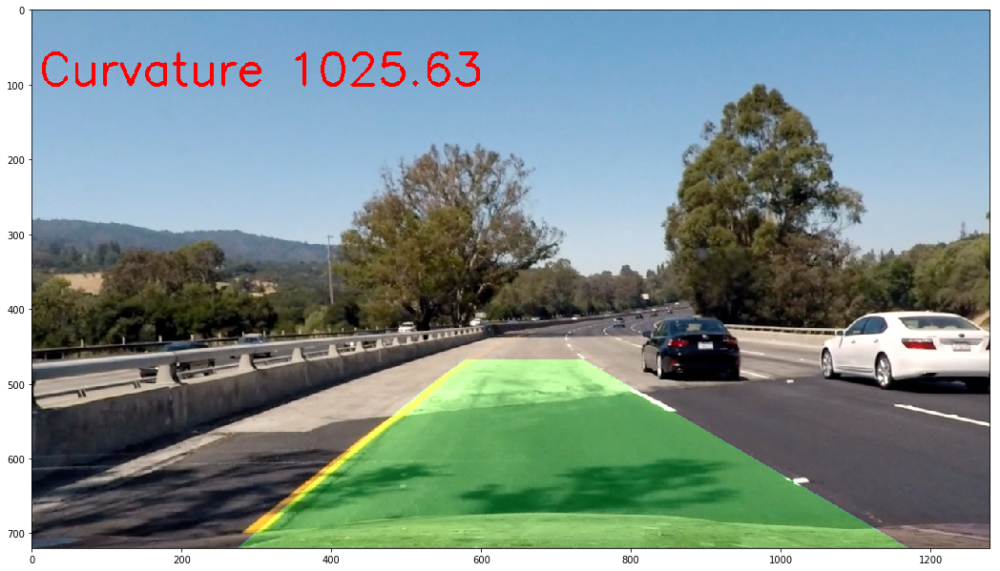

Image Undistortion


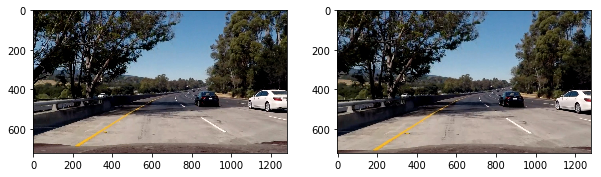

HLS Separation


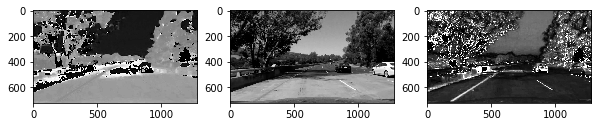

Sobel, Gradient Magn and Gradient Dir and combined 5


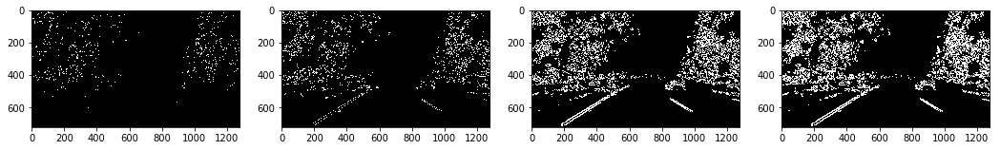

Masked Image and perspective transform (rectification)


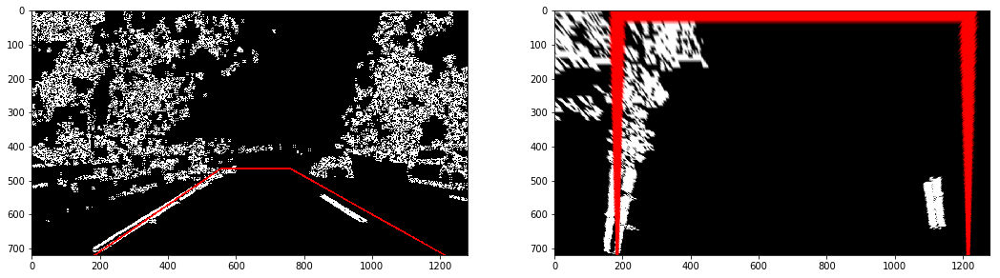

Sliding window search results


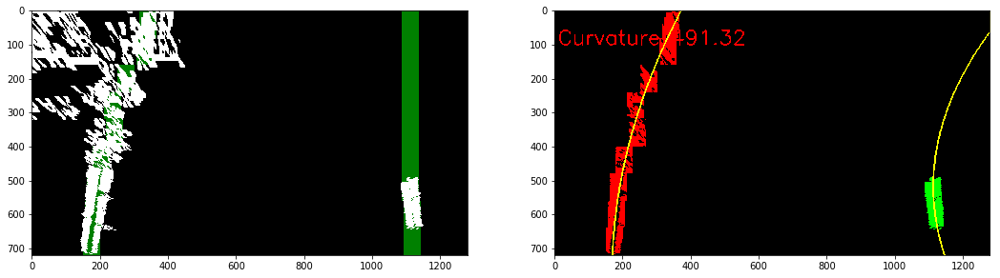

Final Result


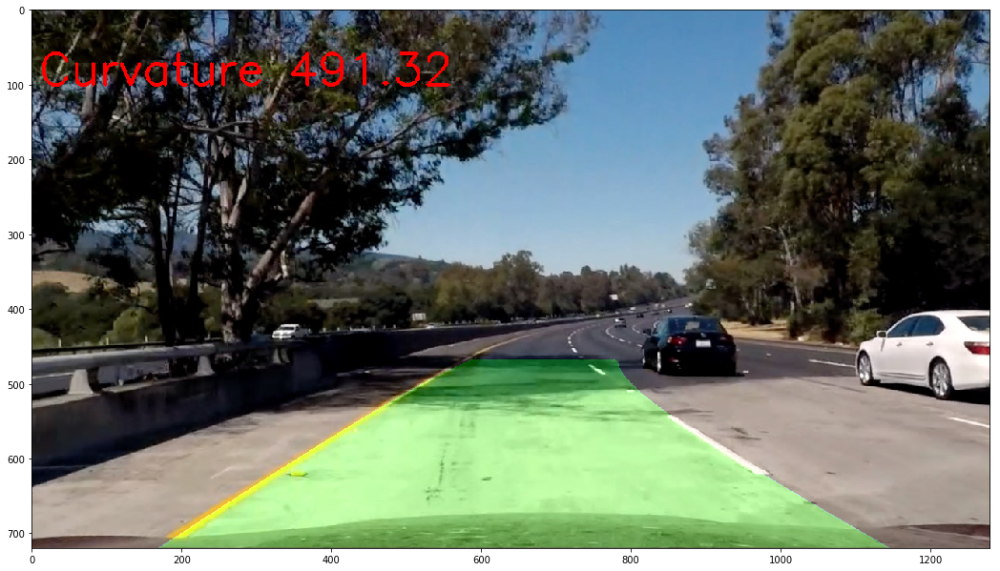

Masked Image and perspective transform (rectification)
Sliding window search results
Final Result
Masked Image and perspective transform (rectification)
Sliding window search results
Final Result


In [129]:
import pickle
import scipy.misc
import sys

# camera calibration
with open(CAMERA_CALIB_FILE, 'rb') as f:
    camera_calibration_data = pickle.load(f)
    
# save camera matrix and distortion coeffs from dictionary
mtx = camera_calibration_data['matrix']
dist = camera_calibration_data['distortion']
    
# test images
images = glob.glob('test_images/straight*.jpg') + glob.glob('test_images/test*.jpg') 


#print (images)

PLT_INDICES = [1,2,3,4,5]

undistorted = []
for idx, fname in enumerate(images):
    # undistort
    img = cv2.imread(fname)
    img_undist = cv2.undistort(img, mtx, dist, None, mtx)

    
    if idx in PLT_INDICES:
        print ("Image Undistortion")
        plt.rcParams['figure.figsize'] = (10,10)
        #fig = plt.Figure(figsize=(12,10))
        #print ("Image Undistortion example")
        plt.subplot(121)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.subplot(122)
        plt.imshow(cv2.cvtColor(img_undist, cv2.COLOR_BGR2RGB))
        plt.show()
    
    # convert to HLS color space
    hls = cv2.cvtColor(img_undist, cv2.COLOR_RGB2HLS)
    
    # separate channels
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    # plot
    if idx in PLT_INDICES:
        print ("HLS Separation")
        plt.subplot(131)
        plt.gray()
        plt.imshow(H)
        plt.subplot(132)
        plt.imshow(L)
        plt.subplot(133)
        plt.imshow(S)
        plt.show()
        
    
    # S seems like a good choice, so select this image for further processing 
    St = color_threshold(S, (120, 255))
    
    # H seems good to detect shadowy areas, which mess up lane finding
    # idea: use thresholded H to mask shadowy areas from S 
    Ht = color_threshold(H, (0, 30))
    St = St * (1 - Ht)
    
#     print ("Experimental removal of shadows")
#     if idx in PLT_INDICES:
#         plt.subplot(131)
#         plt.imshow(St)
#         plt.subplot(132)
#         plt.imshow(Ht)
#         plt.subplot(133)
#         plt.imshow(St_fixed)
#         plt.show()
    
    
    sobel_abs = abs_sobel_threshold(St, sobel_kernel = 7, thresh=(180,255))
    gradient_magn = mag_threshold(St, sobel_kernel= 7, thresh=(180, 255))
    gradient_dir = dir_threshold(St, sobel_kernel = 7, thresh=(0.6, 1.4))
    combined = combine_binary_or(gradient_magn, gradient_dir)
    
    # filter for noise by looking at the direction again
    #combined = dir_threshold(combined, sobel_kernel = 15, thresh=(0.7, 1.3))
    
    
    if idx in PLT_INDICES:
        print ("Sobel, Gradient Magn and Gradient Dir and combined", idx)
        plt.Figure(figsize=(18,12))
        plt.rcParams['figure.figsize'] = (18,14)

        plt.subplot(141)
        plt.imshow(sobel_abs)
        plt.subplot(142)
        plt.imshow(gradient_magn)
        plt.subplot(143)
        plt.imshow(gradient_dir)
        plt.subplot(144)
        plt.imshow(combined)
        plt.show()
        
        # save for further examination
        fname = "processed_image_" + str(idx) + ".png"
        scipy.misc.imsave(fname, combined*255)
    
    # define masking vertices and mask image
    imshape = combined.shape
    vertices = np.array([[(184,imshape[0]),(555, 465), (760, 465), (1214,imshape[0])]], dtype=np.int32)
    #masked = region_of_interest(combined, vertices )
    
    # do not explicitly mask, just combine images! 
    
    masked = combined
    #h,w = masked.shape
    
    #print ("Masked shape", h, w)
    
    src_points = np.float32(vertices)
    dst_points = np.float32([[184, 720], [184, 0], [1214, 0], [1214,720]])
    
    #print(dst_points)
    
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    M_inv = cv2.getPerspectiveTransform(dst_points, src_points)
    
    rectified = cv2.warpPerspective(masked, M, (w,h), flags=cv2.INTER_LINEAR)

    
    print ("Masked Image and perspective transform (rectification)")

    ############
    ###########  DEBUG: 3 channel image to test perspective transform
    if idx in PLT_INDICES:
        plt.rcParams['figure.figsize'] = (18,14)
        masked_vis = cv2.merge((masked*255, masked*255, masked*255))
    
        masked_vis = cv2.polylines(masked_vis, vertices, 0, (255,0,0), thickness=4)
        plt.subplot(121)
        plt.imshow(masked_vis)
    
        rectified = cv2.warpPerspective(masked, M, (w,h), flags=cv2.INTER_LINEAR)
    
        masked_vis_warp = cv2.warpPerspective(masked_vis, M, (w,h), flags=cv2.INTER_LINEAR)
        plt.subplot(122)
        plt.imshow(masked_vis_warp)
        plt.show()

    #########
    #########
    
    
    
    # histogram analysis
    #print ("Histogram Analysis")
    #histogram = np.sum(rectified[rectified.shape[0]//2:,:], axis=0)
    #if idx in PLT_INDICES:
    #    plt.plot(histogram)
    #    plt.show()
        
    # Create a 3-channel output image to draw on and  visualize the result
    #out_img = np.dstack((rectified, rectified, rectified))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    #midpoint = np.int(histogram.shape[0]/2)
    #leftx_base = np.argmax(histogram[:midpoint])
    #rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    #print("leftx_base", leftx_base, "rightx_base", rightx_base)
    
    output, filtered_l, filtered_r, window_centroids = sliding_window_search(rectified)
    
    
    ### compount image of left/right pixels
    
    # get polynomial coordinate tuples
    poly_coords_l, curve_rad_l = fit_poly(filtered_l)
    poly_coords_r, curve_rad_r  = fit_poly(filtered_r)
    
    
    ### fit polynomials on left and right lane lines

    filtered_vis = np.array(cv2.merge((filtered_l*255, filtered_r*255, np.zeros_like(filtered_l))), np.uint8)
    
    filtered_vis = draw_poly(filtered_vis, poly_coords_l)
    filtered_vis = draw_poly(filtered_vis, poly_coords_r)
    
    
    
        
    ### select from which side to determine curvature 
    ### (we want to choose the side with more white pixels in the bottom 50 pixels of the image)
    
    left_pixels_ct = np.count_nonzero(filtered_l[-50:,:])
    right_pixels_ct = np.count_nonzero(filtered_r[-50:,:])
    
    if left_pixels_ct > right_pixels_ct:
        curvature_rad = curve_rad_l
    else:
        curvature_rad = curve_rad_r
        
    curvature_txt = "Curvature %.2f" % (curvature_rad)
    cv2.putText(filtered_vis, curvature_txt, (10,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,0,0),4)
        
    print("Sliding window search results")
    if idx in PLT_INDICES:
        plt.rcParams['figure.figsize'] = (18,14)
        plt.subplot(121)
        plt.imshow(output)
        plt.subplot(122)
        plt.imshow(filtered_vis)
        plt.show()
        
    ## drawing found lane lines back original image 
    
    rectified_zero = np.zeros_like(rectified).astype(np.uint8)
    color_warp = np.dstack((rectified_zero, rectified_zero, rectified_zero))
    
    # draw lines
    color_warp = draw_poly(color_warp, poly_coords_l)
    color_warp = draw_poly(color_warp, poly_coords_r)
    
    # fill area between lines
    color_warp = draw_poly_filled(color_warp, poly_coords_l, poly_coords_r)
    
    # project image back to camera-space
    color_unwarp = cv2.warpPerspective(color_warp, M_inv, (rectified.shape[1], rectified.shape[0]))
    
    visualization = cv2.addWeighted(img_undist, 1, color_unwarp, 0.3,0)
    cv2.putText(visualization, curvature_txt, (10,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,255),4)

    
    print ("Final Result")
    if idx in PLT_INDICES:
        plt.imshow(cv2.cvtColor(visualization, cv2.COLOR_BGR2RGB))
        plt.show()
    


## Video Processing Pipeline

In [217]:
class Filter:
    ''' helper class that implements basic averaging filter
        could be extended to provided more advanced filters, 
        e.g.,weighted average or gaussian'''
    def __init__(self, winsize = 10, axis = 0):
        self.winsize = winsize
        # FIFO queue
        self.filter_queue = []
        self.axis = axis
        
        
    def add_value(self, value):
        if len(self.filter_queue) >= self.winsize:
            # remove last element
            del self.filter_queue[-1]
        self.filter_queue.insert(0, value)
        
    def get_average(self):
        '''returns average of values in the queue'''
        q = np.array(self.filter_queue)
        return np.array(np.mean(q, axis = self.axis), dtype='int64')
      
    
    def has_value(self):
        return len(self.filter_queue) > 0

## Line Class
class Line():
    def __init__(self, side ='LEFT'):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        #### filtering
        self.curvature_filter = Filter(winsize = 25, axis = 0)
        self.x_filter = Filter(winsize = 20, axis = 0)
        self.avg_center = 0
        
        self.side = side
        
        #self.x_filter.add_value(np.zeros(720))
        
    def update_x_fitted(self, fitted):
        self.detected = True
        self.x_filter.add_value(fitted)
        
    
    def update_curvature(self, radius):
        self.curvature_filter.add_value(radius)
        
    def get_filtered_poly_coords(self):
        '''returns filtered polygon coordinates'''
        ploty = np.linspace(0, 719, num=720)
        fitted_x = self.x_filter.get_average()
        # last element is the average center of the 
        avg_x  = np.mean(fitted_x)
        self.avg_center = np.mean(avg_x)
        return (ploty, fitted_x)
    
    def get_filtered_curvature(self):
        return self.curvature_filter.get_average()
    
    @staticmethod
    def get_center_offset(left, right, image_width = 1280, lane_width = 3.7):
        # Define conversions in x and y from pixels space to meters
        #ym_per_pix = 30/720 # meters per pixel in y dimension
        c_a = left.avg_center
        c_b = right.avg_center
        #diff = abs(line_a.avg_center - line_b.avg_center)
        cam_center = abs(c_b-c_a / 2.0)
        
        xm_per_pix = 3.7/1000 # meters per pixel in x dimension
        diff = image_width / 2 - cam_center
        diff_m = diff * xm_per_pix
        
       # print ("Lane center", cam_center, 
        #       "PX Diff to image center", diff,
        #       "m diff to image center", diff_m)
        
        return diff_m
        
        

        
        
        
        
        
     
    
   
        
        
        

In [218]:
import pickle
import scipy.misc
import sys

left_line = Line('LEFT')
right_line = Line('RIGHT')

def process_frame(frame):
    global left_line, right_line
    # camera calibration
    with open(CAMERA_CALIB_FILE, 'rb') as f:
        camera_calibration_data = pickle.load(f)

    # load camera matrix and distortion coeffs from dictionary
    mtx = camera_calibration_data['matrix']
    dist = camera_calibration_data['distortion']
    
    # undistort
    img = frame
    img_undist = cv2.undistort(img, mtx, dist, None, mtx)

    # convert to HLS color space
    hls = cv2.cvtColor(img_undist, cv2.COLOR_RGB2HLS)

    # separate channels
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    # S seems like a good choice, so select this image for further processing 
    St = color_threshold(S, (120, 255))
    
    # H seems good to detect shadowy areas, which mess up lane finding
    # idea: use thresholded H to mask shadowy areas from S 
    Ht = color_threshold(H, (0, 30))
    St = St * (1 - Ht)

    sobel_abs = abs_sobel_threshold(St, sobel_kernel = 9, thresh=(140,255))
    gradient_magn = mag_threshold(St, sobel_kernel= 9, thresh=(140, 255))
    gradient_dir = dir_threshold(St, sobel_kernel = 9, thresh=(0.6, 1.4))
    combined = combine_binary_or(sobel_abs, gradient_dir)


    # define masking vertices and mask image
    imshape = combined.shape
    vertices = np.array([[(184,imshape[0]),(555, 465), (760, 465), (1214,imshape[0])]], dtype=np.int32)
    #masked = region_of_interest(combined, vertices )
    masked = combined
    
    h,w = masked.shape
    
    #print ("Masked shape", h, w)
    
    src_points = np.float32(vertices)
    dst_points = np.float32([[180, 720], [184, 0], [1214, 0], [1225,720]])

    M = cv2.getPerspectiveTransform(src_points, dst_points)
    M_inv = cv2.getPerspectiveTransform(dst_points, src_points)


    rectified = cv2.warpPerspective(masked, M, (w,h), flags=cv2.INTER_LINEAR)
    
    ### Sliding Window Search

    output, filtered_l, filtered_r, window_centroids = sliding_window_search(rectified)


    ### compound image of left/right pixels

    # get polynomial coordinate tuples
    poly_coords_l, curve_rad_l = fit_poly(filtered_l)
    poly_coords_r, curve_rad_r  = fit_poly(filtered_r)
    
    ### update line filters
    
   
    
    left_pixels_ct = np.count_nonzero(filtered_l[-50:,:])
    right_pixels_ct = np.count_nonzero(filtered_r[-50:,:])
    
    # values around 1500 provide for good fit. Will consider pixel counts < 750 as "line line not found"
    
    if left_pixels_ct >= 750:
        fitted_x_l = poly_coords_l[1]
        left_line.update_x_fitted(fitted_x_l)

    if right_pixels_ct >= 750:
        fitted_x_r = poly_coords_r[1]
        right_line.update_x_fitted(fitted_x_r)
    
    #print(left_pixels_ct, right_pixels_ct)
    
    
    
    

    ### select from which side to determine curvature 
    ### (we want to choose the side with more white pixels in the bottom 50 pixels of the image)



    if left_pixels_ct > right_pixels_ct:
        left_line.update_curvature(curve_rad_l)
        curvature_rad = left_line.get_filtered_curvature()
    else:
        right_line.update_curvature(curve_rad_r)
        curvature_rad = right_line.get_filtered_curvature()

    if curvature_rad <= 5000:
        curvature_txt = "Curvature %.2f m" % (curvature_rad)
    else:
        curvature_txt = "Straight"


    ## drawing found lane lines back original image 

    rectified_zero = np.zeros_like(rectified).astype(np.uint8)
    color_warp = np.dstack((rectified_zero, rectified_zero, rectified_zero))

    # draw lines
    if left_line.detected:
        color_warp = draw_poly(color_warp, left_line.get_filtered_poly_coords())
    if right_line.detected:
        color_warp = draw_poly(color_warp, right_line.get_filtered_poly_coords())

    # fill area between lines
    center_offs = None
    if left_line.detected and right_line.detected:
        color_warp = draw_poly_filled(color_warp, 
                                      left_line.get_filtered_poly_coords(), 
                                      right_line.get_filtered_poly_coords())
        center_offs = Line.get_center_offset(left_line, right_line)
        
        

    # project image back to camera-space
    color_unwarp = cv2.warpPerspective(color_warp, M_inv, (rectified.shape[1], rectified.shape[0]))

    visualization = cv2.addWeighted(img_undist, 1, color_unwarp, 0.3,0)
    cv2.putText(visualization, curvature_txt, (10,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,255),4)
    
    # if we have a center offset, report it
    if center_offs != None:
        if center_offs < 0:
            center_txt = "%.2f m to left of center" % (abs(center_offs))
        else:
            center_txt = "%.2f m to right of center" % (center_offs)
        cv2.putText(visualization, center_txt, (10,200), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,255),4)
    

    return visualization

In [ ]:
VIDEO_FILE='project_video.mp4'
VIDEO_W = 1280
VIDEO_H = 720

CAMERA_CALIB_FILE = 'camera_calibration.p'


import cv2

cap = cv2.VideoCapture(VIDEO_FILE)

# set codec to mpeg4
fourcc = cv2.VideoWriter_fourcc(*'H264')
out = out = cv2.VideoWriter('lanefinding_output.mp4',fourcc, 30.0, (VIDEO_W, VIDEO_H))

frame_ctr = 0
while True:
    ret,frame = cap.read()
    if ret == False:
        break
    
    lane_frame = process_frame(frame) 
    
    frame_ctr += 1
    print(frame_ctr, end = "\r")
    out.write(lane_frame)
    

print ("Processed", frame_ctr, "Frames")

out.release()
cap.release()


In [215]:
### video playback
from IPython.display import HTML

HTML('''
<video width="640" height="480" controls>
  <source src="lanefinding_output.mp4" type="video/mp4">
</video>''')